In [57]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
#1. see the data

In [58]:
df_cross= pd.read_csv('oasis_cross-sectional.csv')
df_cross = df_cross.set_index('ID')
df_cross.head()
#df_cross.describe()
#df_cross.info()

,M/F,Hand,Age,Educ,SES,MMSE,CDR,eTIV,nWBV,ASF,Delay
ID,,,,,,,,,,,
OAS1_0001_MR1,F,R,74,2.0,3.0,29.0,0.0,1344,0.743,1.306,NaN
OAS1_0002_MR1,F,R,55,4.0,1.0,29.0,0.0,1147,0.810,1.531,NaN
OAS1_0003_MR1,F,R,73,4.0,3.0,27.0,0.5,1454,0.708,1.207,NaN
OAS1_0004_MR1,M,R,28,NaN,NaN,NaN,NaN,1588,0.803,1.105,NaN
OAS1_0005_MR1,M,R,18,NaN,NaN,NaN,NaN,1737,0.848,1.010,NaN


In [59]:
df_cross.isnull().sum()

M/F        0
Hand       0
Age        0
Educ     201
SES      220
MMSE     201
CDR      201
eTIV       0
nWBV       0
ASF        0
Delay    416
dtype: int64

In [60]:
df_long= pd.read_csv('oasis_longitudinal.csv')
df_long = df_long.set_index('Subject ID')
df_long

,MRI ID,Group,Visit,MR Delay,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
Subject ID,,,,,,,,,,,,,,
OAS2_0001,OAS2_0001_MR1,Nondemented,1,0,M,R,87,14,2.0,27.0,0.0,1987,0.696,0.883
OAS2_0001,OAS2_0001_MR2,Nondemented,2,457,M,R,88,14,2.0,30.0,0.0,2004,0.681,0.876
OAS2_0002,OAS2_0002_MR1,Demented,1,0,M,R,75,12,NaN,23.0,0.5,1678,0.736,1.046
OAS2_0002,OAS2_0002_MR2,Demented,2,560,M,R,76,12,NaN,28.0,0.5,1738,0.713,1.010
OAS2_0002,OAS2_0002_MR3,Demented,3,1895,M,R,80,12,NaN,22.0,0.5,1698,0.701,1.034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
OAS2_0185,OAS2_0185_MR2,Demented,2,842,M,R,82,16,1.0,28.0,0.5,1693,0.694,1.037
OAS2_0185,OAS2_0185_MR3,Demented,3,2297,M,R,86,16,1.0,26.0,0.5,1688,0.675,1.040
OAS2_0186,OAS2_0186_MR1,Nondemented,1,0,F,R,61,13,2.0,30.0,0.0,1319,0.801,1.331


In [61]:
df_long.isnull().sum()

MRI ID       0
Group        0
Visit        0
MR Delay     0
M/F          0
Hand         0
Age          0
EDUC         0
SES         19
MMSE         2
CDR          0
eTIV         0
nWBV         0
ASF          0
dtype: int64

In [9]:
# 2.copy_of_ruslan : see the correlation

SyntaxError: invalid syntax (<ipython-input-9-143a9b8aac7b>, line 1)

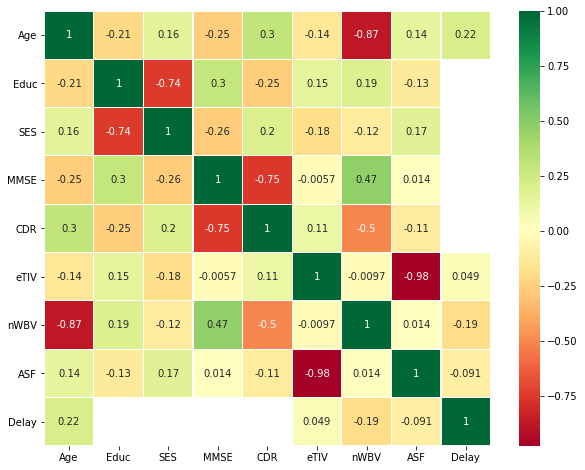

In [8]:
sns.heatmap(df_cross.corr(),annot=True,cmap='RdYlGn',linewidths=0.2) 
fig=plt.gcf()
fig.set_size_inches(10,8)
plt.show()

In [ ]:
#age: cdr < nWBV
#Educ : SES > MMSE
#MMSE : CDR > nWBV
#eTIV : ASF

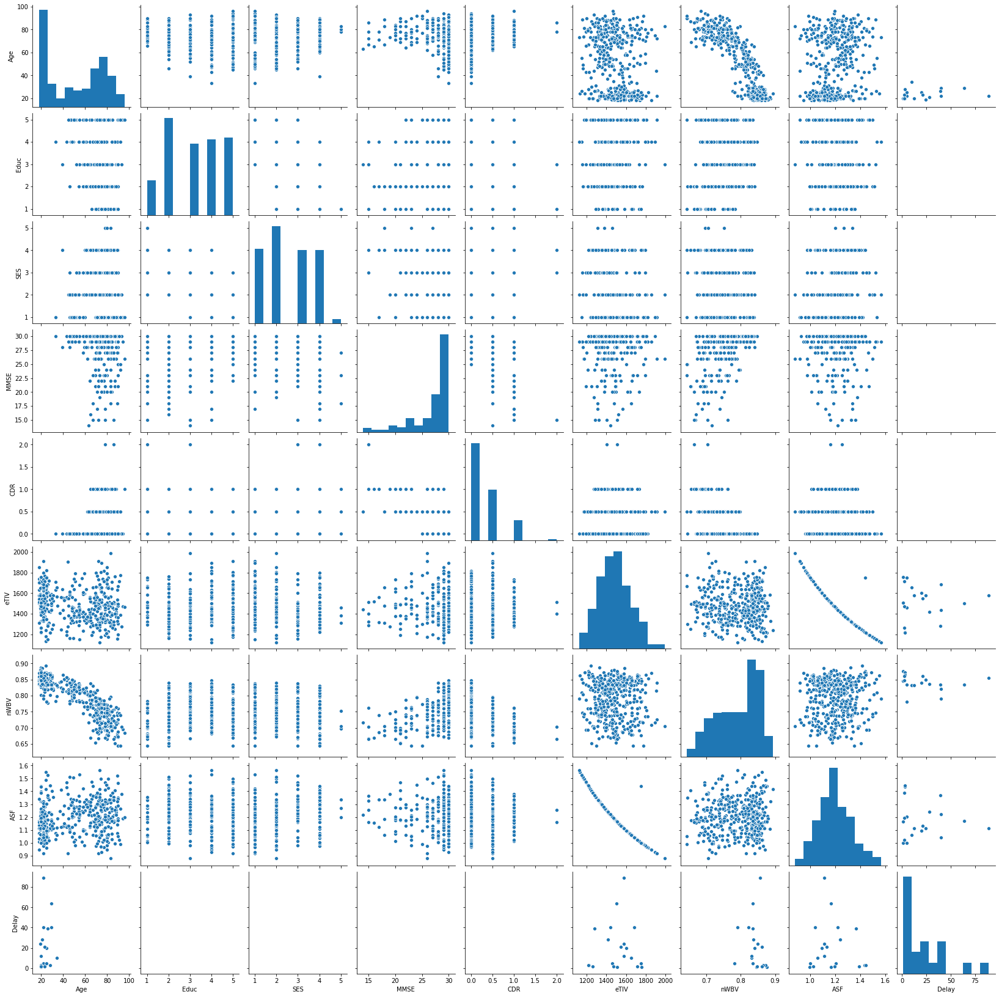

In [81]:
sns.pairplot(df_cross)
plt.show()

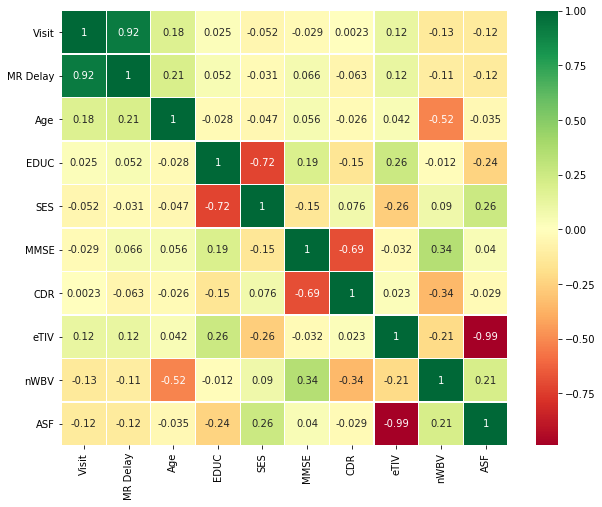

In [82]:
sns.heatmap(df_long.corr(),annot=True,cmap='RdYlGn',linewidths=0.2) 
fig=plt.gcf()
fig.set_size_inches(10,8)
plt.show()


In [35]:
# visit : MR Delay
# age : nWBV
# EDUC : SES > ASF
# SES : eTIV, ASF
# CDR : nWBV
# eTIV : ASF
# nWBV : ASF

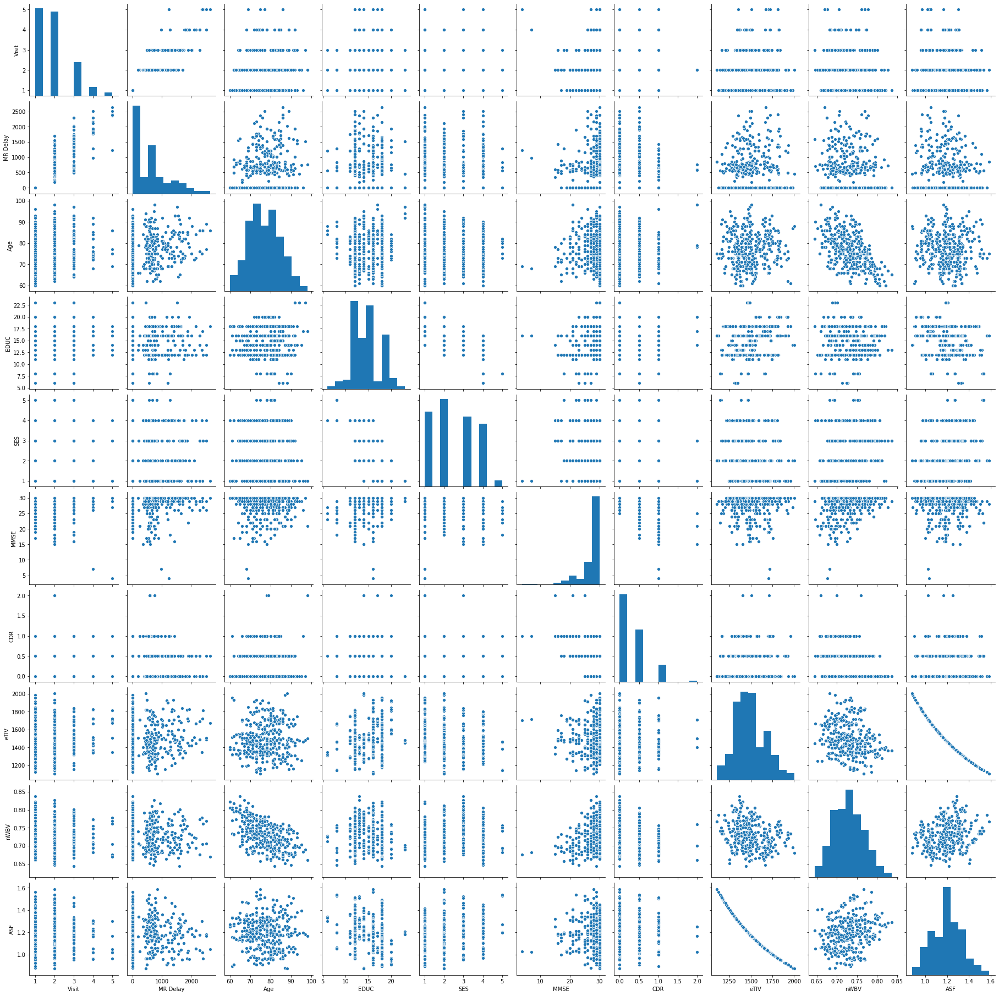

In [31]:
sns.pairplot(df_long)
plt.show()

In [ ]:
# 결측치 nanmedian으로 채우기

In [62]:
df_cross.isnull().sum()


M/F        0
Hand       0
Age        0
Educ     201
SES      220
MMSE     201
CDR      201
eTIV       0
nWBV       0
ASF        0
Delay    416
dtype: int64

In [66]:
print(np.median(df_cross['Educ']))
print(np.median(df_cross['SES']))
print(np.median(df_cross['MMSE']))
print(np.median(df_cross['CDR']))
print(np.median(df_cross['Delay']))
#ALL NAN

print(np.nanmedian(df_cross['Educ']))
print(np.nanmedian(df_cross['SES']))
print(np.nanmedian(df_cross['MMSE']))
print(np.nanmedian(df_cross['CDR']))
print(np.nanmedian(df_cross['Delay']))

df_cross['Educ'] = df_cross['Educ'].fillna(np.nanmedian(df_cross['Educ']))
df_cross['SES'] = df_cross['SES'].fillna(np.nanmedian(df_cross['SES']))
df_cross['MMSE'] = df_cross['MMSE'].fillna(np.nanmedian(df_cross['MMSE']))
df_cross['CDR'] = df_cross['CDR'].fillna(np.nanmedian(df_cross['CDR']))
df_cross['Delay'] = df_cross['Delay'].fillna(np.nanmedian(df_cross['Delay']))

df_cross.isnull().sum()

3.0
nan
nan
nan
nan
3.0
2.0
29.0
0.0
11.0


M/F      0
Hand     0
Age      0
Educ     0
SES      0
MMSE     0
CDR      0
eTIV     0
nWBV     0
ASF      0
Delay    0
dtype: int64

In [67]:
df_long.info()

<class 'pandas.core.frame.DataFrame'>
Index: 373 entries, OAS2_0001 to OAS2_0186
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   MRI ID    373 non-null    object 
 1   Group     373 non-null    object 
 2   Visit     373 non-null    int64  
 3   MR Delay  373 non-null    int64  
 4   M/F       373 non-null    object 
 5   Hand      373 non-null    object 
 6   Age       373 non-null    int64  
 7   EDUC      373 non-null    int64  
 8   SES       354 non-null    float64
 9   MMSE      371 non-null    float64
 10  CDR       373 non-null    float64
 11  eTIV      373 non-null    int64  
 12  nWBV      373 non-null    float64
 13  ASF       373 non-null    float64
dtypes: float64(5), int64(5), object(4)
memory usage: 43.7+ KB


In [68]:
df_long.isnull().sum()

MRI ID       0
Group        0
Visit        0
MR Delay     0
M/F          0
Hand         0
Age          0
EDUC         0
SES         19
MMSE         2
CDR          0
eTIV         0
nWBV         0
ASF          0
dtype: int64

In [69]:
print(np.nanmedian(df_long['SES']))
print(np.nanmedian(df_long['MMSE']))
#numpy.nanmedian() function can be used to calucate the median of array ignoring the NaN value. 

df_long['SES'] = df_long['SES'].fillna(np.nanmedian(df_long['SES']))
df_long['MMSE'] = df_long['MMSE'].fillna(np.nanmedian(df_long['MMSE']))

df_long.isnull().sum()

2.0
29.0


MRI ID      0
Group       0
Visit       0
MR Delay    0
M/F         0
Hand        0
Age         0
EDUC        0
SES         0
MMSE        0
CDR         0
eTIV        0
nWBV        0
ASF         0
dtype: int64

In [1]:
# EDA: Exploratory data analysis
# I hope to check (age, m/f), (educ, ses), (mmse, nwbv), (etiv, asf)

In [ ]:
#1. age, m/f
# no obvious connection between Age/Sex and Demetia Diagnosis.
# DUCK: 0.0 단계에서는 여성이, 0.5단계에서는 남성이 더 많음

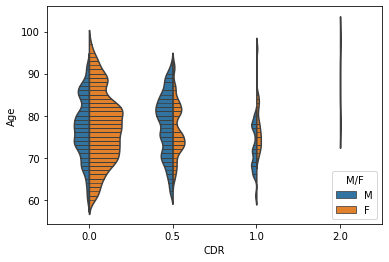

In [70]:
ax = sns.violinplot(x="CDR", y="Age", hue="M/F", data=df_long, split=True, scale="count", inner="stick", scale_hue=False, bw=.2)


In [71]:
df_long[df_long["CDR"] >= 2]

,MRI ID,Group,Visit,MR Delay,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
Subject ID,,,,,,,,,,,,,,
OAS2_0087,OAS2_0087_MR2,Demented,2,754,F,R,98,17,1.0,21.0,2.0,1503,0.66,1.168
OAS2_0120,OAS2_0120_MR2,Demented,2,595,F,R,78,14,3.0,15.0,2.0,1401,0.70,1.253
OAS2_0164,OAS2_0164_MR2,Demented,2,580,M,R,79,20,1.0,25.0,2.0,1710,0.76,1.026


In [ ]:
# educ, ses

In [72]:
# df_long.info()
df_long["EDUC"]
# df_long["CDR"]
df_long["SES"]

Subject ID
OAS2_0001    2.0
OAS2_0001    2.0
OAS2_0002    2.0
OAS2_0002    2.0
OAS2_0002    2.0
            ... 
OAS2_0185    1.0
OAS2_0185    1.0
OAS2_0186    2.0
OAS2_0186    2.0
OAS2_0186    2.0
Name: SES, Length: 373, dtype: float64

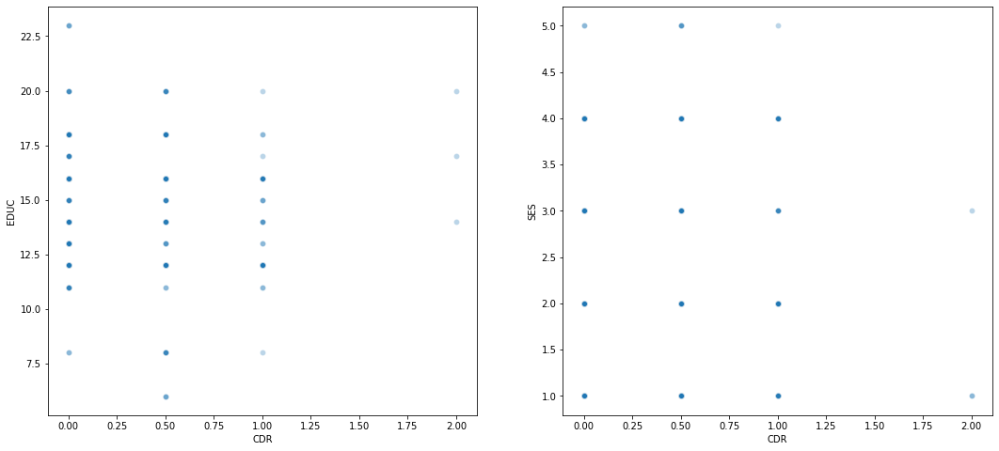

In [97]:
f,ax=plt.subplots(1,2,figsize=(18,8))
sns.scatterplot(data=df_long, x="CDR", y="EDUC", alpha= 0.3, ax = ax[0])
sns.scatterplot(data=df_long, x="CDR", y="SES", alpha= 0.3, ax = ax[1])

plt.show()


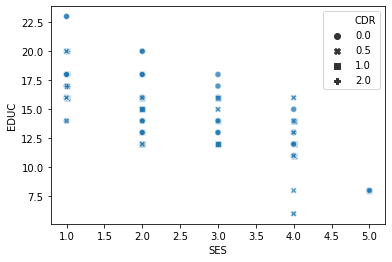

In [113]:
sns.scatterplot(data=df_long, x="SES", y="EDUC", style= "CDR", alpha= 0.5)
plt.show()

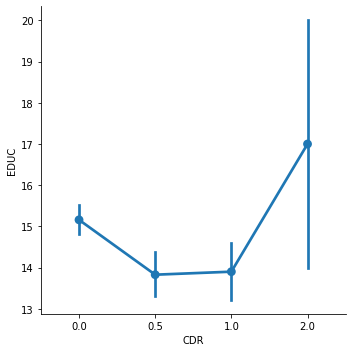

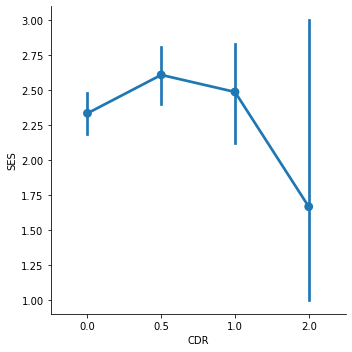

In [104]:
sns.factorplot(data=df_long, x="CDR", y="EDUC")
sns.factorplot(data=df_long, x="CDR", y="SES")
plt.show()

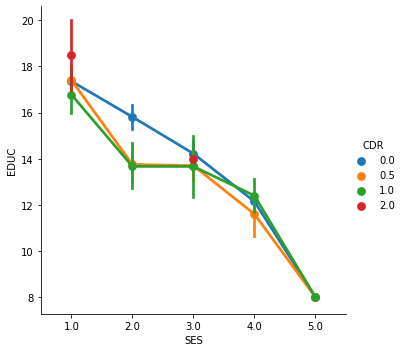

In [105]:
sns.factorplot(data=df_long, x="SES", y="EDUC", hue = 'CDR')

In [ ]:
# MMSE, nWBV

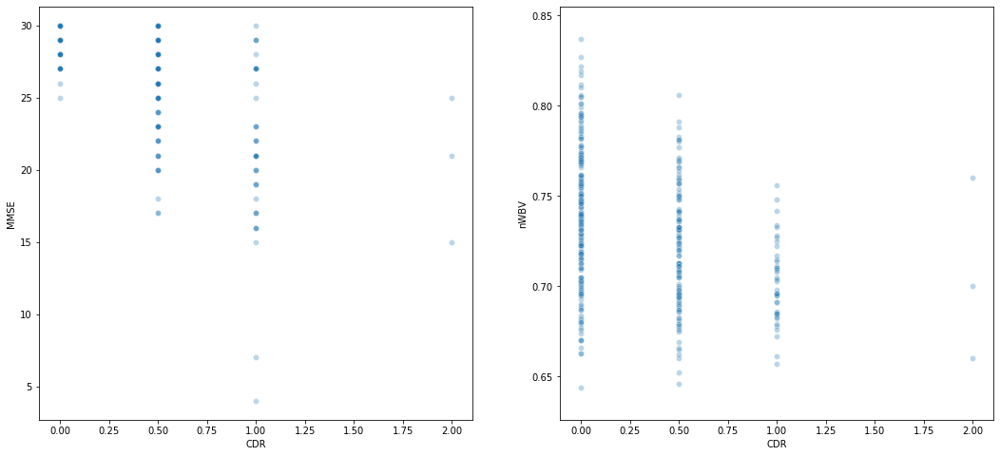

In [116]:
f,ax=plt.subplots(1,2,figsize=(18,8))
sns.scatterplot(data=df_long, x="CDR", y="MMSE", alpha= 0.3, ax = ax[0])
sns.scatterplot(data=df_long, x="CDR", y="nWBV", alpha= 0.3, ax = ax[1])

plt.show()

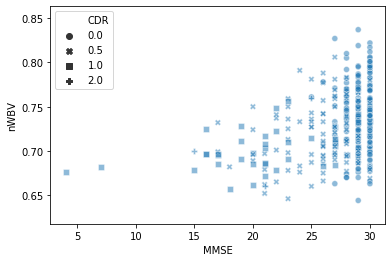

In [119]:
sns.scatterplot(data=df_long, x="MMSE", y="nWBV", style= "CDR", alpha= 0.5)
plt.show()

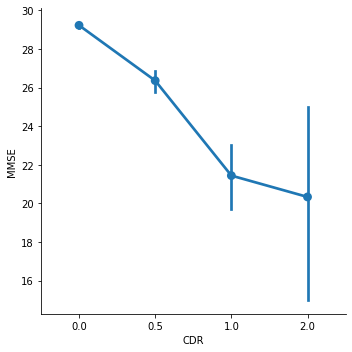

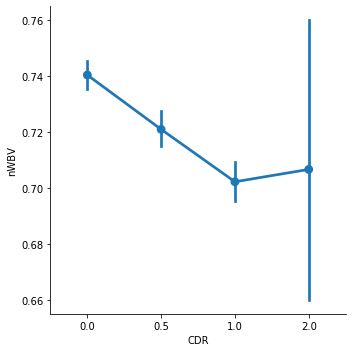

In [120]:
sns.factorplot(data=df_long, x="CDR", y="MMSE")
sns.factorplot(data=df_long, x="CDR", y="nWBV")
plt.show()

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 <a list of 18 Text xticklabel objects>)

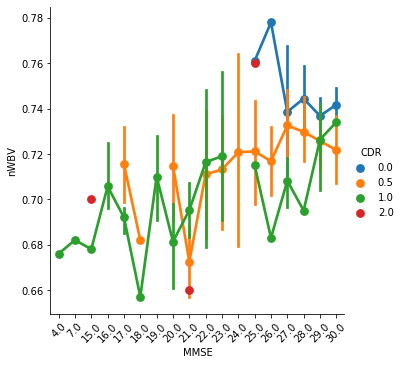

In [124]:
sns.factorplot(data=df_long, x="MMSE", y="nWBV", hue = 'CDR')
plt.xticks(rotation = 45 )

In [ ]:
#eTIV, ASF

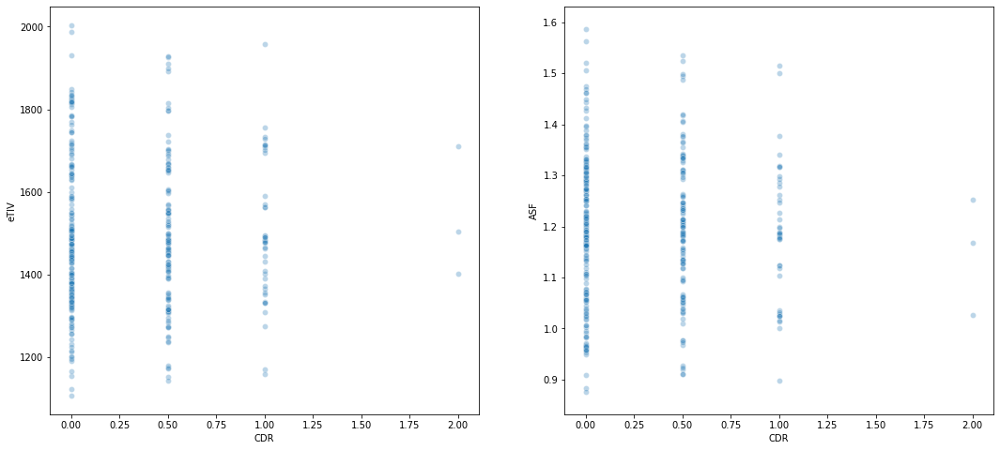

In [125]:
f,ax=plt.subplots(1,2,figsize=(18,8))
sns.scatterplot(data=df_long, x="CDR", y="eTIV", alpha= 0.3, ax = ax[0])
sns.scatterplot(data=df_long, x="CDR", y="ASF", alpha= 0.3, ax = ax[1])

plt.show()

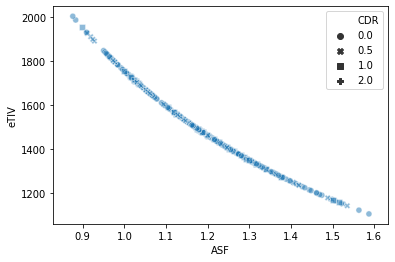

In [126]:
sns.scatterplot(data=df_long, x="ASF", y="eTIV", style= "CDR", alpha= 0.5)
plt.show()

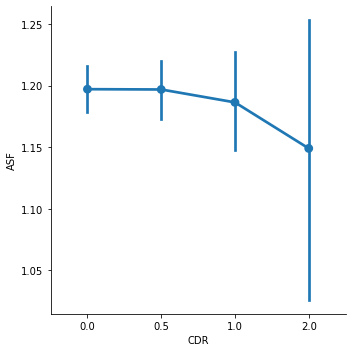

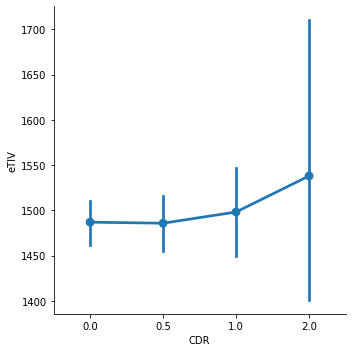

In [127]:
sns.factorplot(data=df_long, x="CDR", y="ASF")
sns.factorplot(data=df_long, x="CDR", y="eTIV")
plt.show()

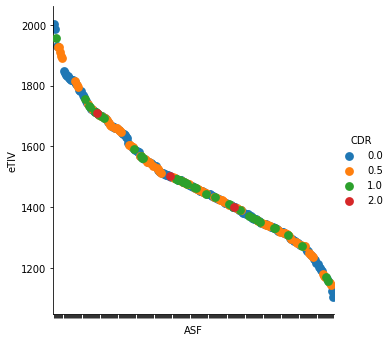

In [138]:
sns.factorplot(data=df_long, x="ASF", y="eTIV", hue = 'CDR').set(xticklabels=[])
plt.show()